In [1]:
#Importing libraries 
import numpy as np 
import pandas as pd
import seaborn as sns 
import matplotlib.pylab as plt

import plotly.express as px
from matplotlib.ticker import FuncFormatter
plt.style.use('ggplot')

In [2]:
df_temp = pd.read_csv("D:\\World\\1- temperature-anomaly.csv")
df_emission_region = pd.read_csv("D:\\World\\2- annual-co-emissions-by-region.csv")
df_emission_per_cap = pd.read_csv("D:\\World\\3- co-emissions-per-capita.csv")


In [3]:
df_temp.head()

,Entity,Code,Year,Global average temperature anomaly relative to 1961-1990,Upper bound of the annual temperature anomaly (95% confidence interval),Lower bound of the annual temperature anomaly (95% confidence interval)
0,Global,NaN,1850,-0.417659,-0.246115,-0.589203
1,Global,NaN,1851,-0.233350,-0.054832,-0.411868
2,Global,NaN,1852,-0.229399,-0.049416,-0.409382
3,Global,NaN,1853,-0.270354,-0.110700,-0.430009
4,Global,NaN,1854,-0.291630,-0.150436,-0.432824


In [4]:
df_emission_region.head()

,Entity,Code,Year,Annual CO₂ emissions
0,Afghanistan,AFG,1949,14656.0
1,Afghanistan,AFG,1950,84272.0
2,Afghanistan,AFG,1951,91600.0
3,Afghanistan,AFG,1952,91600.0
4,Afghanistan,AFG,1953,106256.0


In [5]:
df_emission_per_cap.head()

,Entity,Code,Year,Annual CO₂ emissions (per capita)
0,Afghanistan,AFG,1949,0.001992
1,Afghanistan,AFG,1950,0.011266
2,Afghanistan,AFG,1951,0.012098
3,Afghanistan,AFG,1952,0.011946
4,Afghanistan,AFG,1953,0.013685


### Data Preparation

1. **Dropping Irrelevant Columns and Rows**:
   - Remove columns or rows that do not contribute to the analysis or are unnecessary for your specific analysis.

2. **Identifying Duplicated Columns**:
   - Check for and handle duplicate columns that may have been unintentionally included in the dataset.

3. **Renaming Columns**:
   - Rename columns to more meaningful or consistent names to improve clarity and ease of use in your analysis.

4. **Feature Creation**:
   - Create new features or variables from existing data to enhance the dataset and provide additional insights.


In [6]:
df_emission_region.columns

Index(['Entity', 'Code', 'Year', 'Annual CO₂ emissions'], dtype='object')

In [7]:
df_emission_per_cap.columns

Index(['Entity', 'Code', 'Year', 'Annual CO₂ emissions (per capita)'], dtype='object')

In [8]:
# Removing use columns

df_emission_region = df_emission_region [['Entity', 
                                          'Code', 
                                          'Year', 
                                          'Annual CO₂ emissions']]

In [9]:
df_emission_per_cap = df_emission_per_cap [['Entity', 
                                            'Code', 
                                            'Year',
                                            'Annual CO₂ emissions (per capita)']]

In [10]:
#Check to see if df_emission_region has null value 
df_emission_region.isna().sum()

Entity                     0
Code                    6151
Year                       0
Annual CO₂ emissions       0
dtype: int64

In [11]:
#Check to see if df_emission_per_capital has null value
df_emission_per_cap.isna().sum()

Entity                                  0
Code                                 3554
Year                                    0
Annual CO₂ emissions (per capita)       0
dtype: int64

In [12]:
# Check to see if there any duplicated records 
df_emission_region.duplicated().sum()

0

In [13]:
df_emission_per_cap.duplicated().sum()

0

### Feature Understanding (Univariate Analysis)

- **Plotting Feature Distribution**
- **Histogram**
- **KDE**
- **Boxplot**


Text(0.5, 0, 'Annual Co2 emission')

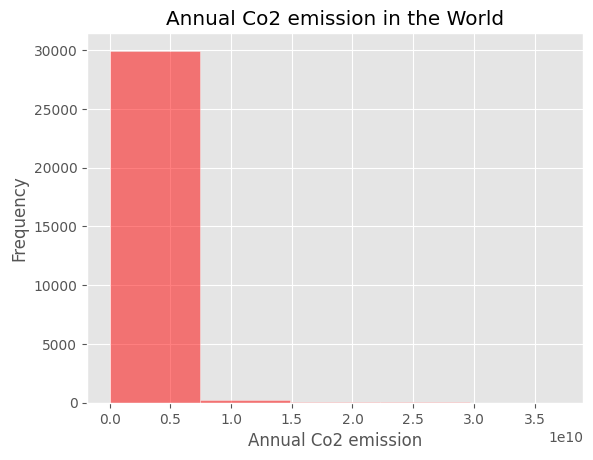

In [14]:
ax = df_emission_region['Annual CO₂ emissions']\
    .plot(kind = 'hist', 
          bins = 5,
         title = 'Annual Co2 emission in the World',
         color = 'red', 
         edgecolor = 'white',
         alpha = 0.5)
ax.set_xlabel('Annual Co2 emission')

Text(0.5, 0, 'Annual Co2 emission')

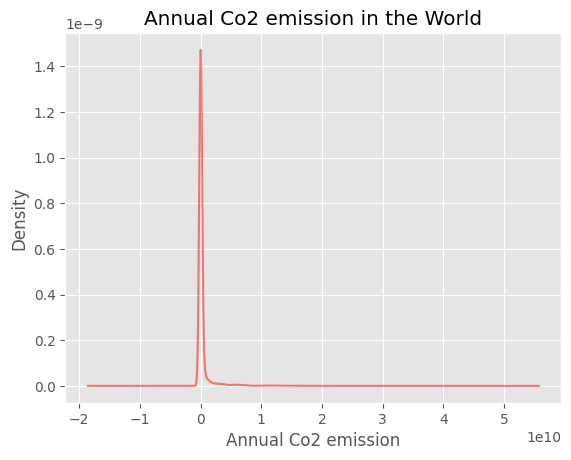

In [15]:
ax = df_emission_region['Annual CO₂ emissions']\
    .plot(kind = 'kde', 
         title = 'Annual Co2 emission in the World',
         color = 'red', 
         alpha = 0.5)
ax.set_xlabel ('Annual Co2 emission')

###  Feature Relationships


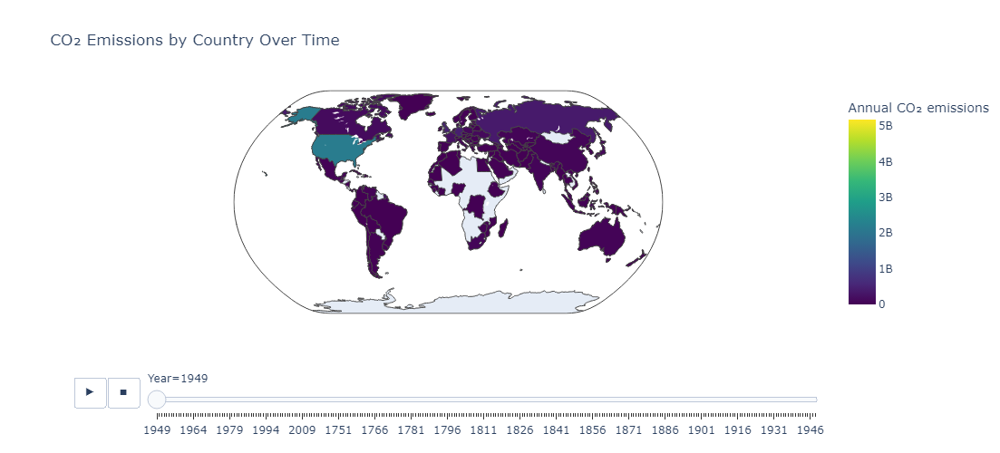

In [16]:
import pandas as pd
import plotly.express as px

# Load the dataset
data = pd.read_csv(r"C:\Users\nithi\Downloads\2- annual-co-emissions-by-region.csv")

# Create an animated choropleth map with a larger size
fig = px.choropleth(
    data,
    locations="Code",  
    color="Annual CO₂ emissions",  
    hover_name="Entity",  
    animation_frame="Year",  
    color_continuous_scale="Viridis",  
    projection="natural earth",  
    title="CO₂ Emissions by Country Over Time",
    width=1000,  
    height=500   
)

# Show the map
fig.show()

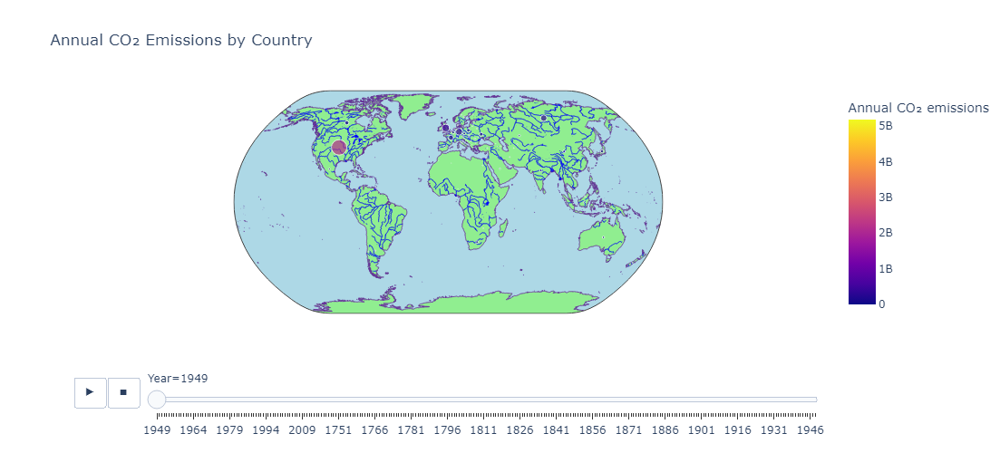

In [17]:
import pandas as pd
import plotly.express as px

# Load the dataset
df_emission_region = pd.read_csv(r"C:\Users\nithi\Downloads\2- annual-co-emissions-by-region.csv")

# Map Analysis Annual CO₂ Emissions by Region
df = df_emission_region

fig = px.scatter_geo(
    df,
    locations='Code',
    locationmode='ISO-3',  # Define the location using country code
    color='Annual CO₂ emissions',
    size='Annual CO₂ emissions',
    hover_name='Entity',  
    animation_frame='Year',  
    projection='natural earth',
    title='Annual CO₂ Emissions by Country',
    size_max=50,
        width=1200,  
        height=500 
    
)

fig.update_geos(
    resolution=50,
    showcoastlines=True, coastlinecolor="RebeccaPurple",
    showland=True, landcolor="LightGreen",
    showocean=True, oceancolor="LightBlue",
    showlakes=True, lakecolor="Blue",
    showrivers=True, rivercolor="Blue"
)

fig.show()


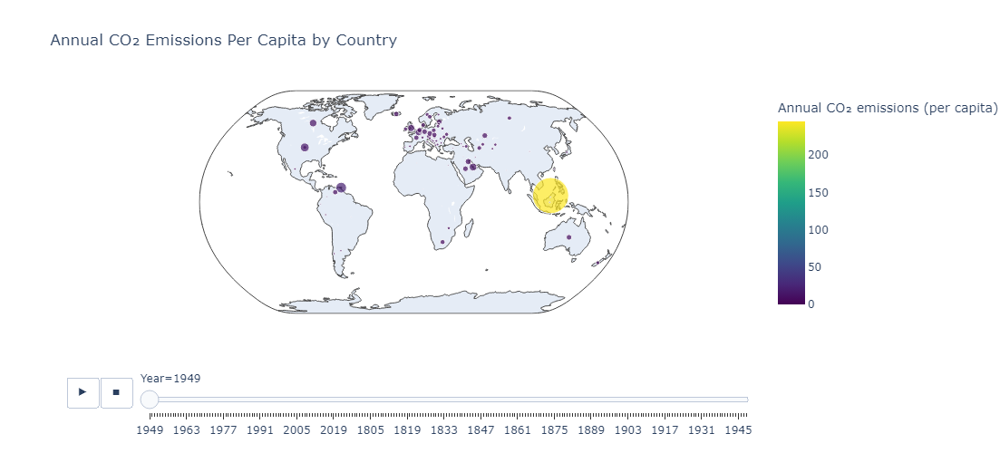

In [18]:
import pandas as pd
import plotly.express as px

# Load the dataset
df_emission_per_cap = pd.read_csv("D:\\World\\3- co-emissions-per-capita.csv")

# Create the scatter_geo plot with custom width and height
fig = px.scatter_geo(
        df_emission_per_cap, 
        locations='Entity', 
        locationmode='country names',  
        color='Annual CO₂ emissions (per capita)',
        size='Annual CO₂ emissions (per capita)',
        hover_name='Entity', 
        animation_frame='Year', 
        projection='natural earth', 
        title='Annual CO₂ Emissions Per Capita by Country',
        color_continuous_scale='Viridis',
        size_max=50,
        width=1200,  
        height=500  
)

fig.show()


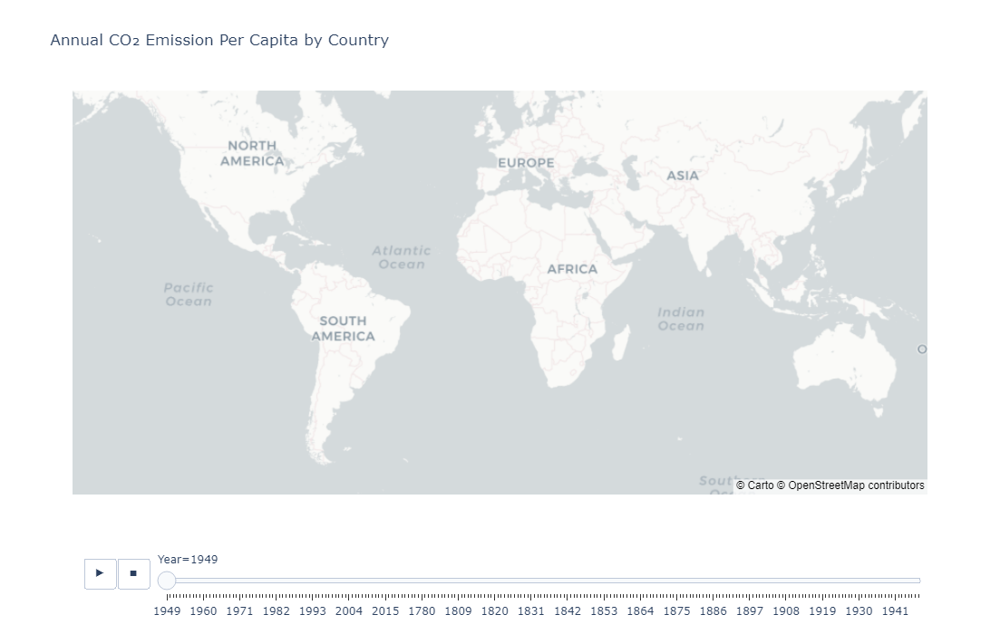

In [20]:
import pandas as pd
import plotly.express as px

# Load the dataset
df_1 = df_emission_per_cap

# Create the choropleth mapbox plot
fig = px.choropleth_mapbox(
   df_1,
   geojson=None,  
   locations='Entity', 
   color='Annual CO₂ emissions (per capita)',
   hover_name='Code', 
   animation_frame='Year', 
   title='Annual CO₂ Emission Per Capita by Country', 
   color_continuous_scale='Viridis'
)

# Update the layout to include the mapbox style and zoom
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=1,  
    mapbox_center={"lat": 0, "lon": 0},  
    width=1100,  
    height=700   
)

fig.show()

### Conclusion

In this series of visualizations, we explored various aspects of CO₂ emissions across the world, focusing on both total emissions and per capita emissions. The analyses provided insights into the distribution, trends, and geographic patterns of CO₂ emissions over time. Here's a summary of the findings:

1. **Global Distribution of CO₂ Emissions**:
   - The histogram and KDE plot of annual CO₂ emissions illustrate the overall distribution of emissions across different regions. The KDE plot, in particular, highlights the density and spread of emissions, indicating regions with higher concentrations of CO₂ emissions.

2. **Temporal Trends in CO₂ Emissions**:
   - The animated choropleth map provided a dynamic view of how CO₂ emissions have evolved over time across different countries. This visualization was crucial in identifying trends and changes in emissions patterns, allowing for a temporal analysis of environmental impact.

3. **Geographical Patterns**:
   - The scatter_geo and choropleth mapbox visualizations depicted the geographic distribution of both total and per capita CO₂ emissions. These maps highlighted regions with significant emissions, showing both the concentration and the magnitude of emissions by country.
   - By varying parameters such as the size of markers and the color scale, the visualizations effectively communicated the disparities between countries in terms of their contribution to global CO₂ emissions.

4. **Detailed Customizations**:
   - Through various customizations, such as changing the map style, zoom levels, and projections, the visualizations were tailored to provide clearer insights and more aesthetically pleasing representations of the data. The use of different color scales (like Viridis) and adjustments in the map's appearance (e.g., coastline and land color) added depth to the analysis.

Overall, these visualizations collectively demonstrate the uneven distribution of CO₂ emissions worldwide, the significant differences between countries, and the evolving nature of these emissions over time. Such analyses are essential for understanding the global challenge of climate change and for formulating targeted policies to mitigate its impact.
